In [1]:
from glob import glob
import os
import scanpy as sc
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from matplotlib.colors import TwoSlopeNorm
import matplotlib as mpl
import gseapy as gp

In [2]:
figpath = '/stanley/WangLab/kamal/figures/projects/manifesto/juxtacrine_max/'
os.makedirs(figpath, exist_ok=True)
dpi = 500

# Load

In [3]:
paths = glob('/stanley/WangLab/kamal/data/technologies/xenium/mouse_ad/filtered/*juxtacrine.h5ad')
adatas = [sc.read_h5ad(path) for path in paths]

In [4]:
adatas

[AnnData object with n_obs × n_vars = 58684 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine',
 AnnData object with n_obs × n_vars = 60829 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine',
 AnnData object with n_obs × n_vars = 59889 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine',
 AnnData object with n_obs × n_vars = 53906 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine',
 AnnData object with n_obs × n_vars = 58230 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     la

In [5]:
filter_key = 'juxtacrine'
max_mag = 2

for i in range(len(adatas)):

    # Scale
    sc.pp.scale(adatas[i], layer=filter_key)

    # Clip
    X = adatas[i].layers[filter_key]
    X[X > max_mag] = max_mag
    X[X < -max_mag] = -max_mag

adata = sc.concat(adatas)

/home/unix/kmaher/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [6]:
# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 15
fignorm = set_width / width
sc.set_figure_params(figsize=(set_width, height*fignorm))
figsize=(set_width, height*fignorm)

# Disease-specific interactions

## Embedding

In [7]:
def embed(adata, samples1, samples2, n_comps, filter_key):

    adata1 = adata[np.isin(adata.obs['sample'],samples1)]
    adata2 = adata[np.isin(adata.obs['sample'],samples2)]

    X = adata1.layers[filter_key]
    X -= X.mean(axis=0)
    A = X.T @ X

    X_ = adata2.layers[filter_key]
    X_ -= X_.mean(axis=0)
    B = X_.T @ X_

    w,V = eigh(A,B)
    w = w[::-1]
    V = V[:,::-1]

    V = V[:,:n_comps]
    adata.obsm[f'X_pca_{filter_key}'] = adata.layers[filter_key] @ V
    adata.varm[f'X_pca_{filter_key}'] = V
    adata.uns[f'comp_var_{filter_key}'] = w

    return V

In [8]:
samples = adata.obs['sample'].unique()
samples1 = [sample for sample in samples if 'TgCRND8' in sample]
samples2 = [sample for sample in samples if 'wildtype' in sample]

In [9]:
n_comps = 3

V = embed(adata, samples1, samples2, n_comps, filter_key)

## Plot PCs

==================== PC1 ====================


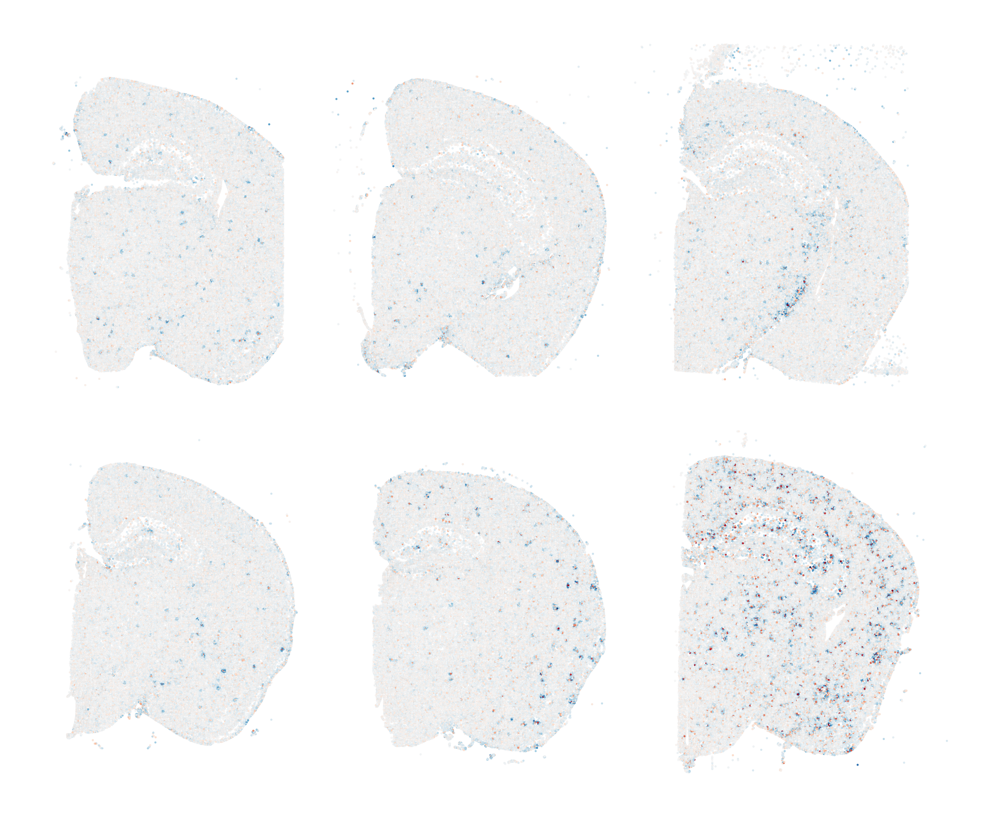

Positive markers:  ['Itgax', 'Cd74', 'Gpnmb', 'Cd14', 'Trem2', 'Tyrobp', 'Mpeg1', 'Lyz2', 'Cd68', 'Apoe']
Negative markers:  ['Tmem119', 'Olfml3', 'Osmr', 'Cst3', 'C4b', 'Csf1r', 'Cxcl10', 'Tgm1', 'C4a', 'Slc6a3']



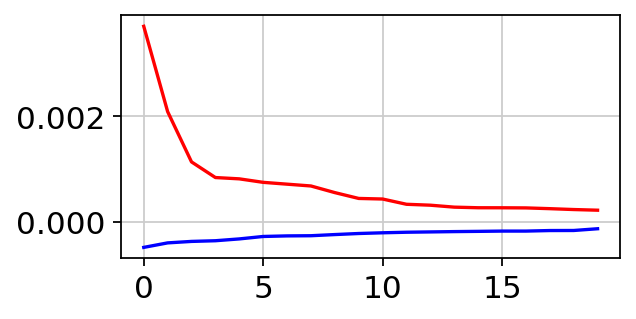

==================== PC2 ====================


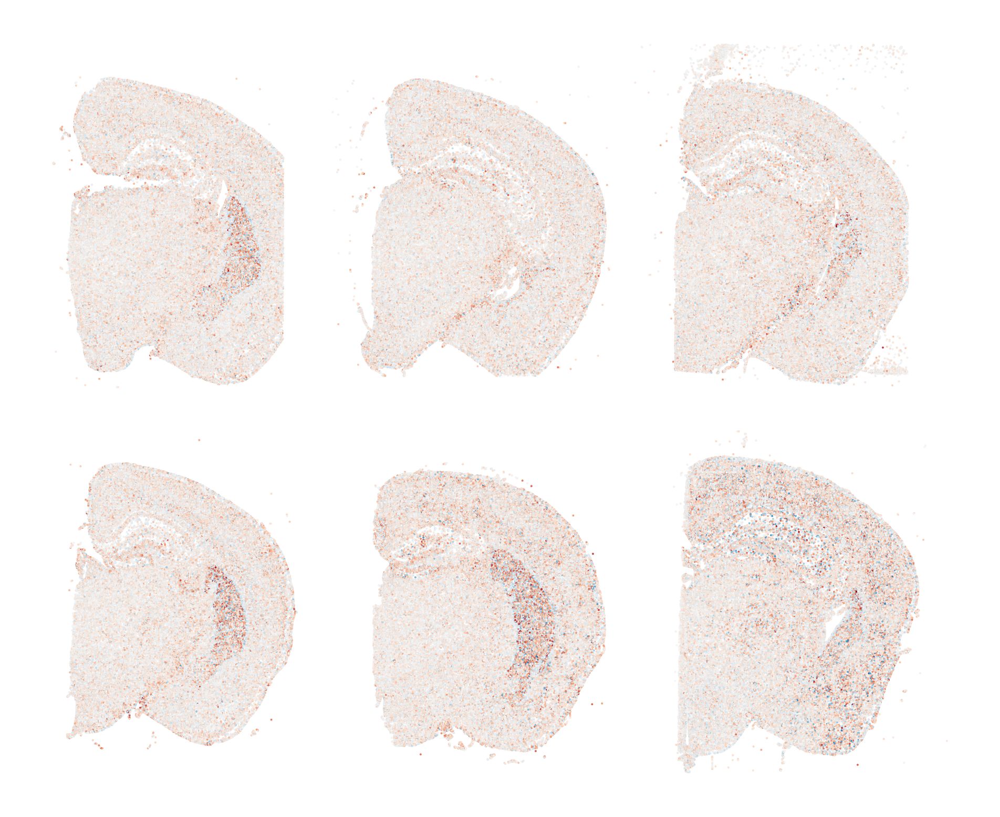

Positive markers:  ['Itgax', 'Strip2', 'Col6a1', 'Plekha2', 'Syt6', 'Ppp1r1b', '2010300C02Rik', 'Lamp5', 'Epha4', 'Pdzd2']
Negative markers:  ['Osmr', 'Gpnmb', 'Serpina3n', 'C4b', 'C4a', 'Cxcl10', 'Aspg', 'Fos', 'Id2', 'Vim']



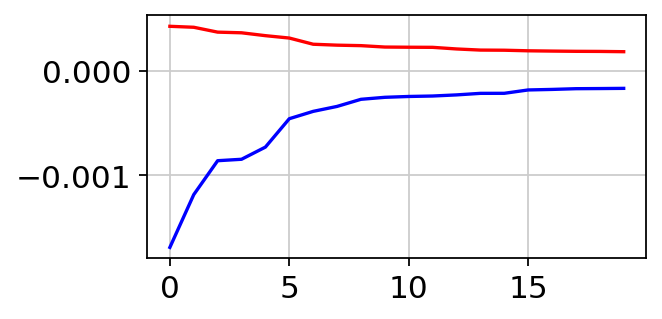

==================== PC3 ====================


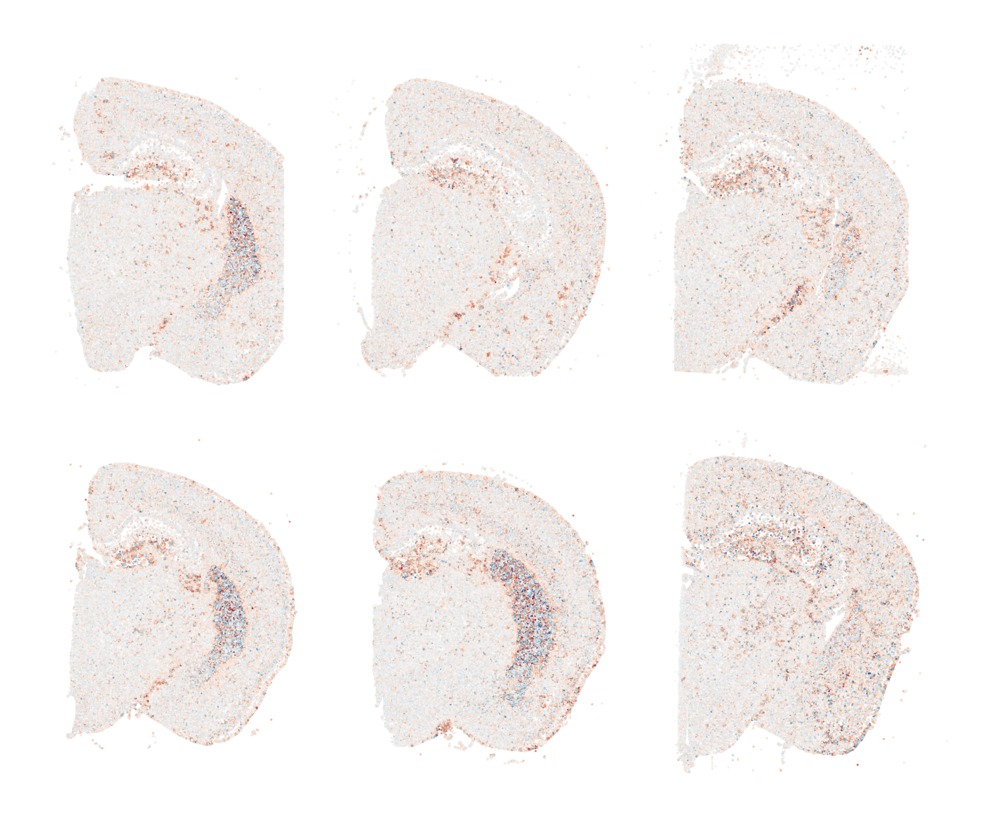

Positive markers:  ['Nostrin', 'Paqr5', 'Cldn5', 'Ndst4', 'Mpeg1', 'Sst', 'Cpne4', 'Dner', 'Slc6a3', 'Lcn2']
Negative markers:  ['Gpnmb', 'Osmr', 'Strip2', 'Itgax', 'Syt6', 'Col6a1', 'Cd44', 'Pdyn', 'C4a', 'Plekha2']



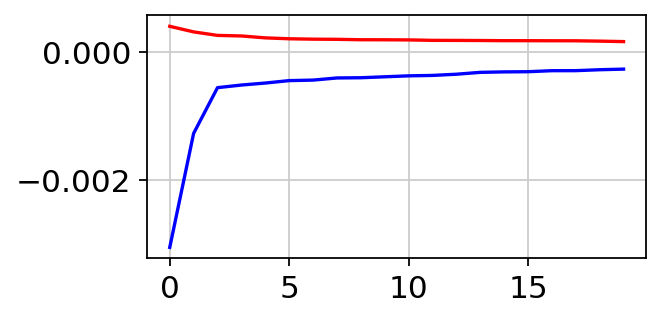

In [10]:
n_markers = 10
cmap = 'RdBu_r'

for i in range(n_comps):

    print('='*20, f'PC{i+1}', '='*20)

    # Calculate PC
    c = adata.layers[filter_key] @ V[:,i]
    adata.obs[f'c{i}'] = c

    # Plot in tissue
    cmax = np.abs(c).max()
    norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
    # norm = TwoSlopeNorm(vcenter=0, vmin=-cmax, vmax=cmax)
    points = adata.obsm['spatial']
    plt.figure(figsize=figsize)
    plt.scatter(
        points[:,0],
        points[:,1],
        edgecolor='k',
        linewidth=0.005,
        s=3,
        c=c,
        cmap=cmap,
        norm=norm,
    )
    plt.axis('off')
    filename = os.path.join(figpath, f'juxtacrine_pc{i+1}.png')
    plt.savefig(filename, dpi=dpi)
    plt.show()
    
    # Print markers
    marker_idxs = np.argsort(V[:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]
    print('Positive markers: ', list(pos_marker_genes))
    print('Negative markers: ', list(neg_marker_genes))
    print()
    
    # Print weights
    plt.figure(figsize=(4,2))
    plt.plot(np.sort(V[:,i])[::-1][:20], c='r')
    plt.plot(np.sort(V[:,i])[:20], c='b')
    plt.show()

### Zoom 1

In [11]:
i = 0
c = adata.obs[f'c{i}']
norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())

In [32]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = zoom_width

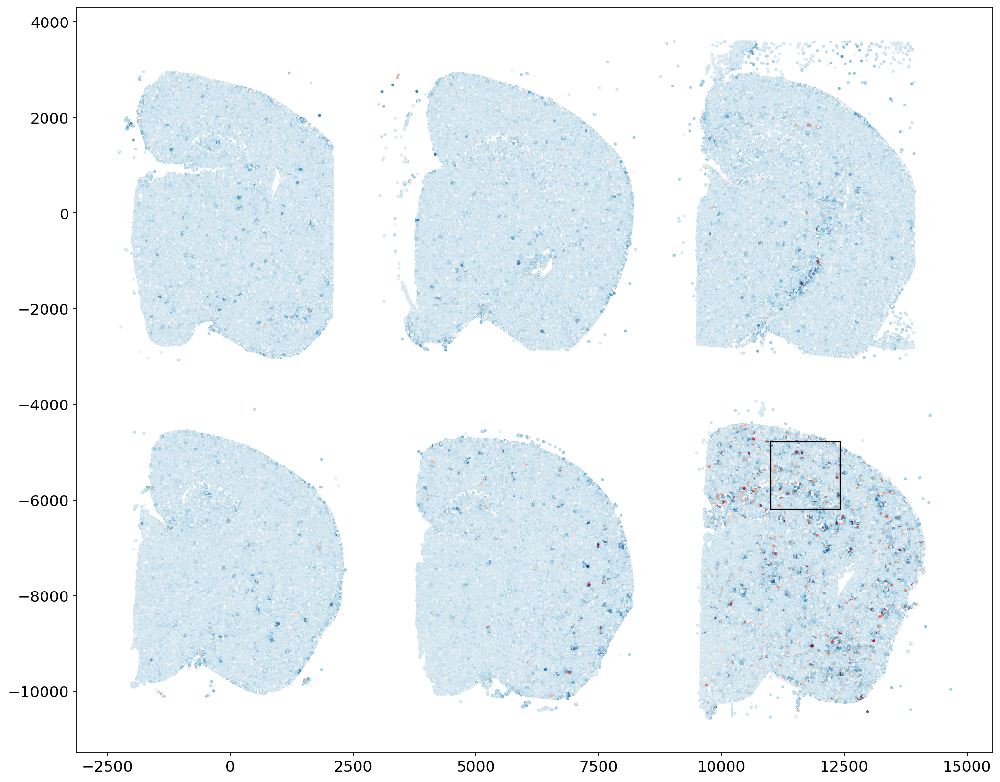

In [33]:
# /8
zoom_x = 11000
zoom_y = -6200

# # /6
# zoom_x = 20500
# zoom_y = -7600

# # /5
# zoom_x = 10000
# zoom_y = -7000

# # /4
# zoom_x = 19300
# zoom_y = -9000

plt.figure(figsize=figsize)
plt.scatter(*adata.obsm['spatial'].T, s=3, c=c, cmap=cmap)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [34]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

In [35]:
c = zdata.obs[f'c{i}']
znorm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())

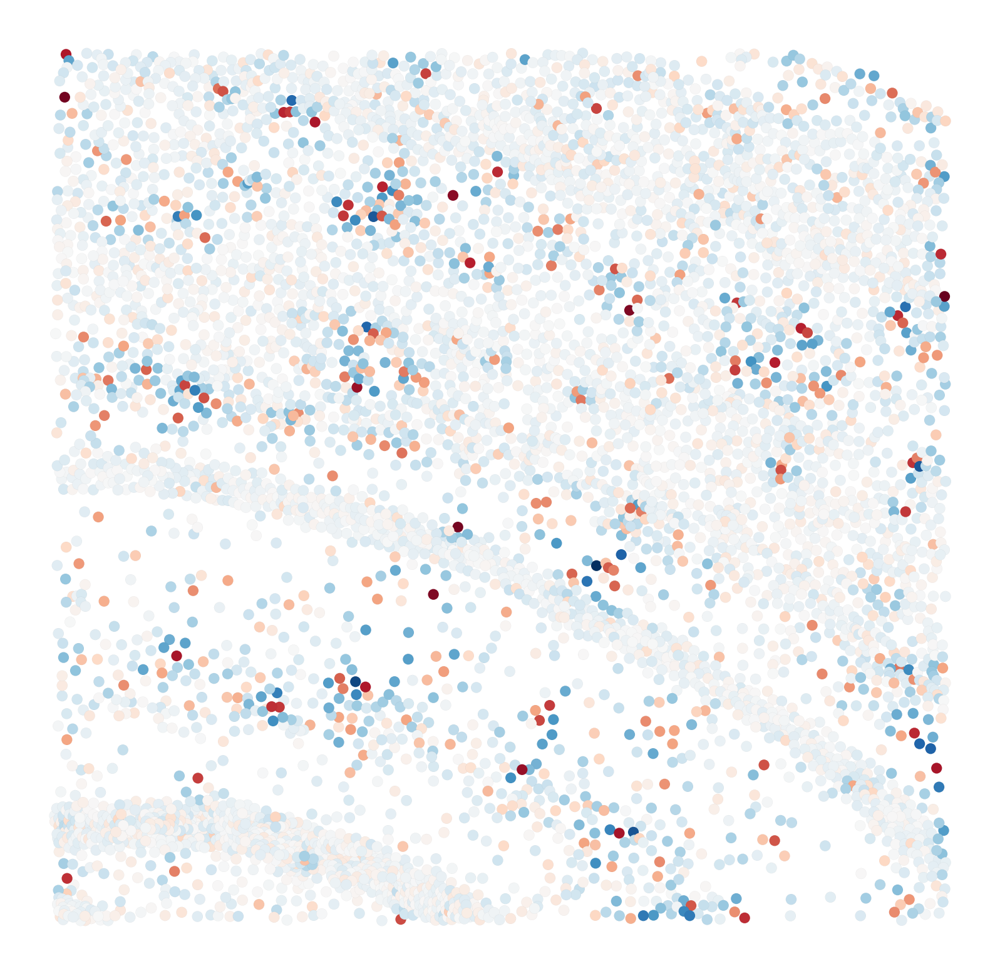

In [37]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=60,
    c=zdata.obs[f'c{i}'],
    cmap=cmap,
    norm=znorm,
)
plt.axis('off')
filename = os.path.join(figpath, f'juxtacrine_zoom.png')
plt.savefig(filename, dpi=dpi)
plt.show()

### Zoom 2

In [12]:
i = 0
c = adata.obs[f'c{i}']
norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())

In [13]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = zoom_width

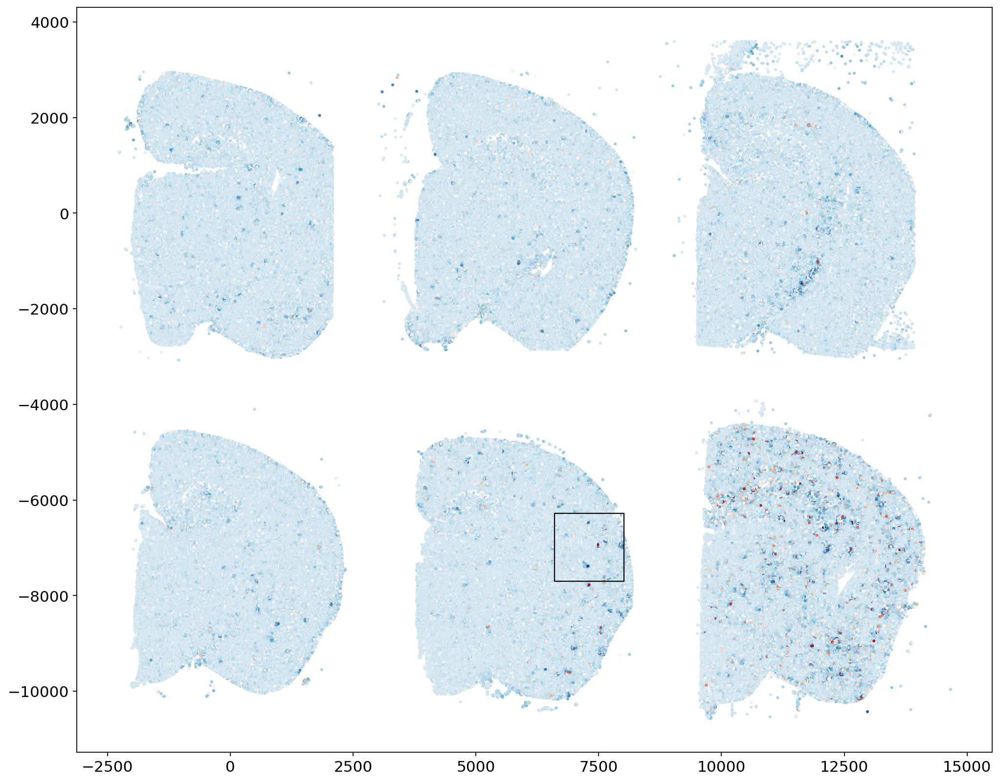

In [14]:
# /8
zoom_x = 6600
zoom_y = -7700

# # /6
# zoom_x = 20500
# zoom_y = -7600

# # /5
# zoom_x = 10000
# zoom_y = -7000

# # /4
# zoom_x = 19300
# zoom_y = -9000

plt.figure(figsize=figsize)
plt.scatter(*adata.obsm['spatial'].T, s=3, c=c, cmap=cmap)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [15]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

In [16]:
c = zdata.obs[f'c{i}']
znorm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())

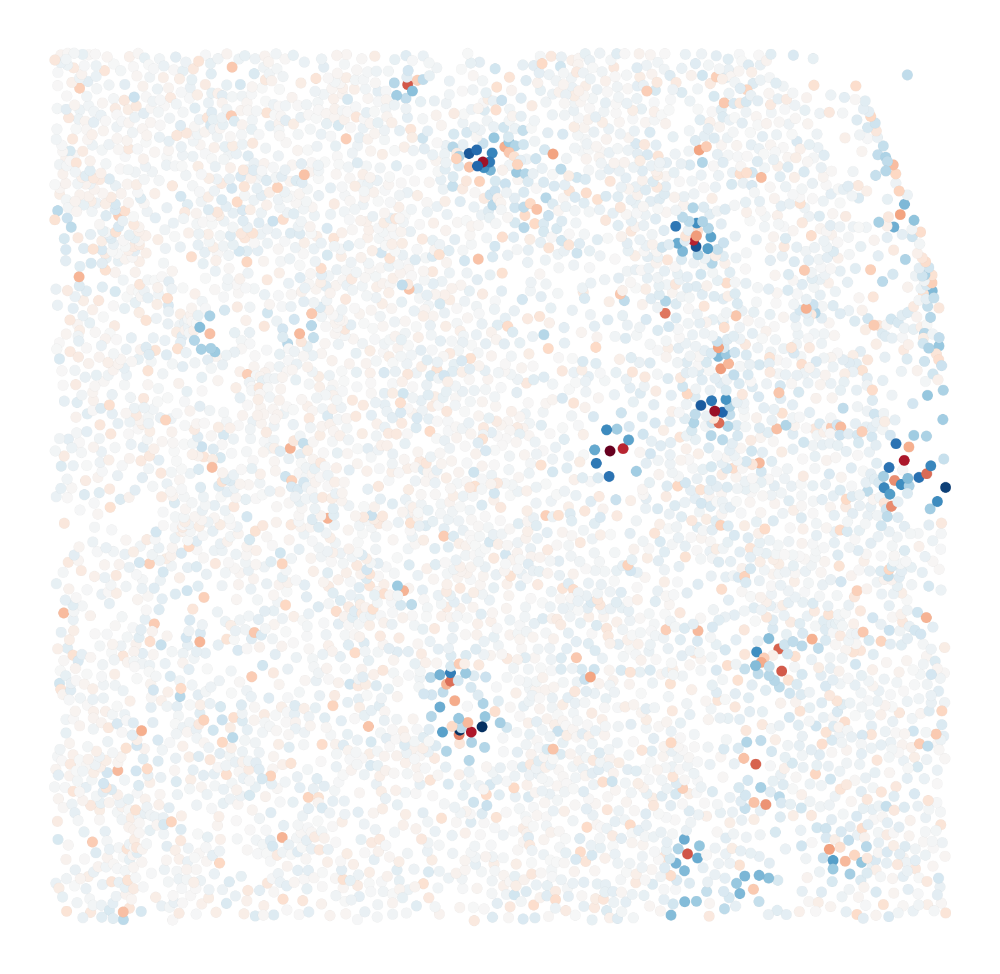

In [17]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=60,
    c=zdata.obs[f'c{i}'],
    cmap=cmap,
    norm=znorm,
)
plt.axis('off')
filename = os.path.join(figpath, f'juxtacrine_zoom2.png')
plt.savefig(filename, dpi=dpi)
plt.show()